In [1]:
from pylab import*
import numpy as np
import matplotlib.pyplot as plt
import skimage
from ipywidgets import interact, interactive, fixed, interact_manual
import ipywidgets as widgets
from heapq import heappush, heappop

In [2]:
def lpfilter(filt_type, Ny, Nx, sigma, n=1):
    '''
         filt_type - filter type, can be gaussian, butterwort or ideal
         Ny - filter image height
         Nx - filter image width
         sigma - standard deviation
         n - coefficient in case of butterwort filter
         
         Returns formed filter mask.
         
         Function generates filter mask in frequentistic domain.
         
         Source: Vezbe
    '''
    # Finding middle of the grid in 
    if (Ny%2 == 0):
        y = np.arange(0,Ny) - Ny/2 + 0.5
    else:
        y = np.arange(0,Ny) - (Ny-1)/2
    
    if (Nx%2 == 0):
        x = np.arange(0,Nx) - Nx/2 + 0.5
    else:
        x = np.arange(0,Nx) - (Nx-1)/2

    # Making grid
    X, Y = meshgrid(x, y)
    
    D = np.sqrt(np.square(X) + np.square(Y))
    
    # Choosing filter type and adequate formula
    if filt_type == 'gaussian':
        filter_mask = exp(-np.square(D)/(2*np.square(sigma)))
    elif filt_type == 'btw':
        filter_mask = 1/(1+(D/sigma)**(2*n))
    elif filt_type == 'ideal':
        filter_mask = ones([Ny, Nx])
        filter_mask[D>sigma] = 0
    else:
        print('Greška! Nije podržan tip filtra: ', filt_type)
        return
    
    # Returning mask
    return filter_mask

In [3]:
def cnotch(filt_type, notch, Ny, Nx, C, r, n=1):
    '''
         filt_type - filter type, can be gaussian, butterwort or ideal
         notch - whether to pass or reject area inside of filter
         Ny - filter image height
         Nx - filter image width
         C - coordinates of dots where filters should be applied
         r - standard deviation
         n - coefficient in case of butterwort filter
         
         Returns formed filter mask.
         
         Function generates notch filter mask in frequentistic domain.
         
         Source: Vezbe
    '''
    # Getting number of filters
    N_filters = len(C)

    filter_mask = zeros([Ny,Nx])
    
    # Generating center of grid
    if (Ny%2 == 0):
        y = np.arange(0,Ny) - Ny/2 + 0.5
    else:
        y = np.arange(0,Ny) - (Ny-1)/2
    
    if (Nx%2 == 0):
        x = np.arange(0,Nx) - Nx/2 + 0.5
    else:
        x = np.arange(0,Nx) - (Nx-1)/2
    # Generating grid
    X, Y = meshgrid(x, y)
    
    # Apllying all filters
    for i in range(0, N_filters):
        # Current dot 
        C_current = C[i]
        
        # Centrally symmetric  dot
        C_complement = zeros([2,1])
        C_complement[0] = -C_current[0]
        C_complement[1] = -C_current[1]
        
        # Transforming coordinates to coordinate system with origin centered in curent point
        if (Ny%2 == 0):
            y0 = y - C_current[0] + Ny/2 - 0.5
        else:
            y0 = y - C_current[0] + (Ny-1)/2
        
        if (Nx%2 == 0):
            x0 = x - C_current[1] + Nx/2 - 0.5
        else:
            x0 = x - C_current[1] + (Nx-1)/2
        
        # Generating grid for current point
        X0, Y0 = meshgrid(x0, y0)
        
        D0 = np.sqrt(np.square(X0) + np.square(Y0))
        
        # Transforming coordinates to coordinate system with origin centered in complement (centrally symmetric) point
        if (Ny%2 == 0):
            y0c = y - C_complement[0] - Ny/2 + 0.5
        else:
            y0c = y - C_complement[0] - (Ny-1)/2
        
        if (Nx%2 == 0):
            x0c = x - C_complement[1] - Nx/2 + 0.5
        else:
            x0c = x - C_complement[1] - (Nx-1)/2
        
        # Generating grid for current point
        X0c, Y0c = meshgrid(x0c, y0c)
        
        D0c = np.sqrt(np.square(X0c) + np.square(Y0c))
        
        # Choosing filter type
        if filt_type == 'gaussian':
            filter_mask = filter_mask + \
                          exp(-np.square(D0)/(2*np.square(r))) + \
                          exp(-np.square(D0c)/(2*np.square(r)))
        elif filt_type == 'btw':
            filter_mask = filter_mask + \
                          1/(1+(D0/r)**(2*n)) + \
                          1/(1+(D0c/r)**(2*n))
        elif filt_type == 'ideal':
            filter_mask[(D0<=r)|(D0c<=r)] = 1
        else:
            print('Greška! Nije podržan tip filtra: ', filt_type)
            return
    # Coosing wether to pass or reject inside area bounded by filter
    # Since we defined mask as all ones by default it is rejecting outside dots
    if notch == 'pass':
        return filter_mask
    elif notch == 'reject':
        return 1 - filter_mask
    else:
        return

In [4]:
def plot_filter(img, img_fft, filt_freq, alpha = 1):
        '''
            img - original image
            img_fft - fast fourier transform of original image
            filt_freq - mask which will be applied in frequentistic domain
            alpha - coefficient for logaritmic contrast enhancement
            
            Returns:
            img_filt - resulting image in spatial domain
            img_fft_filt - resulting image in frequentistic domain
            
            Function is applying filter on image frequentistic domain and plottting and returning results.
            
        '''
        # Image img in frequentistic domain after applying filter mask filt_freq
        img_fft_filt = img_fft*filt_freq
        # Filtered image in spatial domain
        # Taking real part because of numeric errors
        img_filt = real(ifft2(ifftshift(img_fft_filt)))
        # Clipping image in range 0 to 1 if there was some over or undershooting
        img_filt = np.clip(img_filt, 0, 1)
        
        # Plotting results
        fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(10,12), dpi=120)
        ax = axes.ravel()

        ax[0].imshow(img, cmap='gray',vmin = 0, vmax = 1); ax[0].set_axis_off(); ax[0].set_title('Ulazna slika')
        ax[1].imshow(log(1+abs(img_fft)), cmap='gray'); ax[1].set_axis_off(); ax[1].set_title('Spektar ulazne slike')
        ax[2].imshow(log(1+abs(filt_freq)), cmap='gray'); ax[2].set_axis_off(); ax[2].set_title('Filtar')
        ax[3].imshow(log(1+abs(img_fft_filt)), cmap='gray'); ax[3].set_axis_off(); ax[3].set_title('Spektar filtrirane slike')
        ax[4].imshow(img_filt, cmap='gray', vmin=0, vmax=1); ax[4].set_axis_off(); ax[4].set_title('Izlaz nakon filtriranja')
        ax[5].set_axis_off();
        
        # Returning resulting image in spatial an frequentistic domain respectively
        return (img_filt, img_fft_filt)

# Zadatak 1

In [5]:
# Reading image
img = skimage.img_as_float(skimage.io.imread('../sekvence/girl_ht.tif'))
# Image height and width
[Ny, Nx] = img.shape
# Fourier transform of image
img_fft = fftshift(fft2(img))

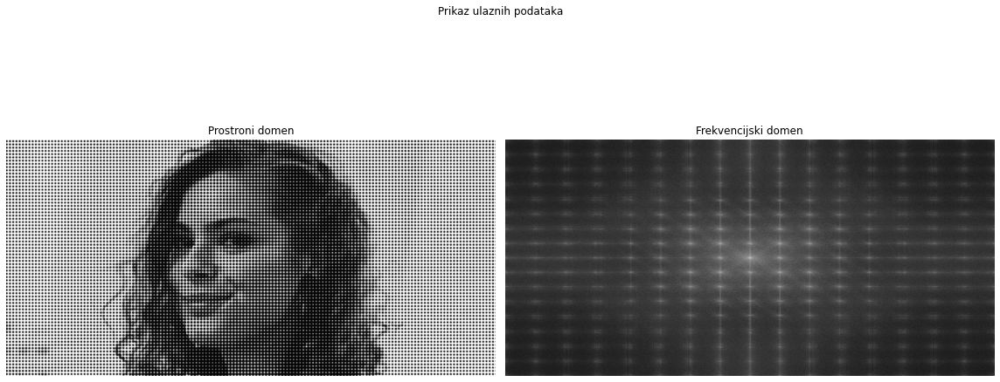

In [6]:
fig,axes = plt.subplots(ncols = 2, nrows = 1, figsize = (16,8))
fig.suptitle('Prikaz ulaznih podataka')
axes[0].imshow(img, cmap = 'gray', vmin = 0, vmax = 1)
axes[0].set_axis_off()
axes[0]. set_title('Prostroni domen')
axes[1].imshow(log(1+abs(img_fft)),cmap = 'gray')
axes[1].set_axis_off()
axes[1].set_title('Frekvencijski domen')
plt.tight_layout()

S obzirom da primecujemo u spektru slike da imamo jake komponente sinusoida u visokofrekventnom delu spektra treba primeniti Notch filtar. Ipak, kako je uklanjanje svih ovih komponenti jedne po jedne notch filtrom kompjuterski zahtevno i svakako nam veliki deo visokofrekventnog dela spektra nije potreban jer sadrzi samo sum prvo cemo sa LP filtrom ukloniti sve komponente koje su dovoljno daleko od centra a onda notch filtrom ukloniti ostatak suma kako bi nam ostali sto vise ocuvani detalji slike. 
Zbog ocuvanja periodicnosti spektra (zbog diskretne prirode slike spektar mora biti periodican) potrebno je da imamo parove simetricnih komponenti koje uklanjamo. Za niskofrekventno filtriranje koristicemo Gausov filtar da ne bi doslo do ripple efekta do koga dolazi u slucaju idealnog filtriranja i butterwort-ovog filtra viseg reda, i da bi ivice bile sto vise ocuvane.

## 1.1. Primena NF Gausovog filtra

### std = 55

Ako uzmemo premalu standardnu devijaciju, uklonicemo skoro sve sinusoidalne komponenta ali cemo ostati bez ivica slike

### NF filtriranje

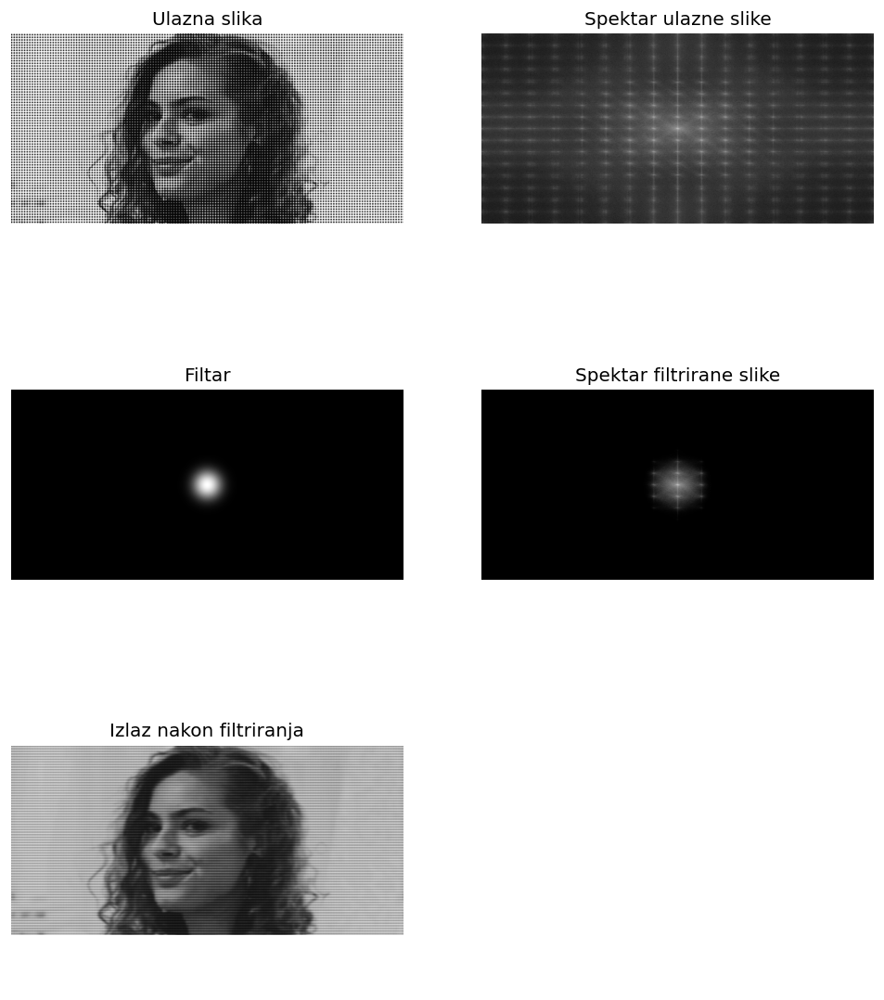

In [7]:
# Applying Gaussian low pass filter with std = 55
filt_freq_lp = lpfilter('gaussian',Ny, Nx, 55)
(img_filt_lp, img_fft_filt_lp) = plot_filter(img, img_fft, filt_freq_lp)

### Notch filtriranje

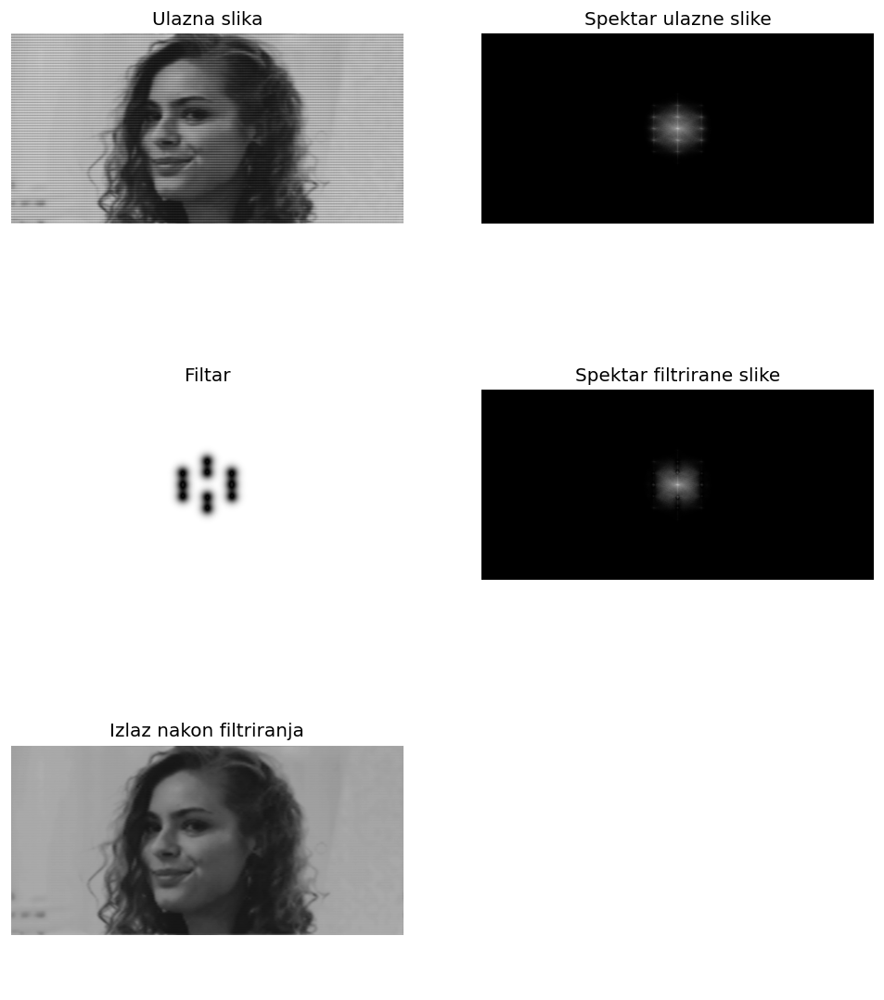

In [8]:
# Dots where to apply notch
C = np.array([[Ny//2+Ny//16, Nx//2-Nx//16],[Ny//2+Ny//16, Nx//2+Nx//16],[Ny//2+Ny//16, Nx//2+0],[Ny//2+2*Ny//16, Nx//2+0],\
              [Ny//2+0,Nx//2-Nx//16]])
# Applying Gaussian notch filter
filt_freq_nc_2 = cnotch('gaussian', 'reject', Ny, Nx, C, 30)
(img_filt_nc_2, img_fft_filt_nc_2)  =plot_filter(img_filt_lp, img_fft_filt_lp, filt_freq_nc_2)

### std = 75

Ako za standardnu devijaciju gausovog filtra uzmemo preveliku vrednost obuhvaticemo previse komponenti sinusoida koje kasnije treba ukloniti notch filtrom posebno a moze se desiti i da ostavimo na slici previse okolnih tackica koje su takodje sum.

### NF filtriranje

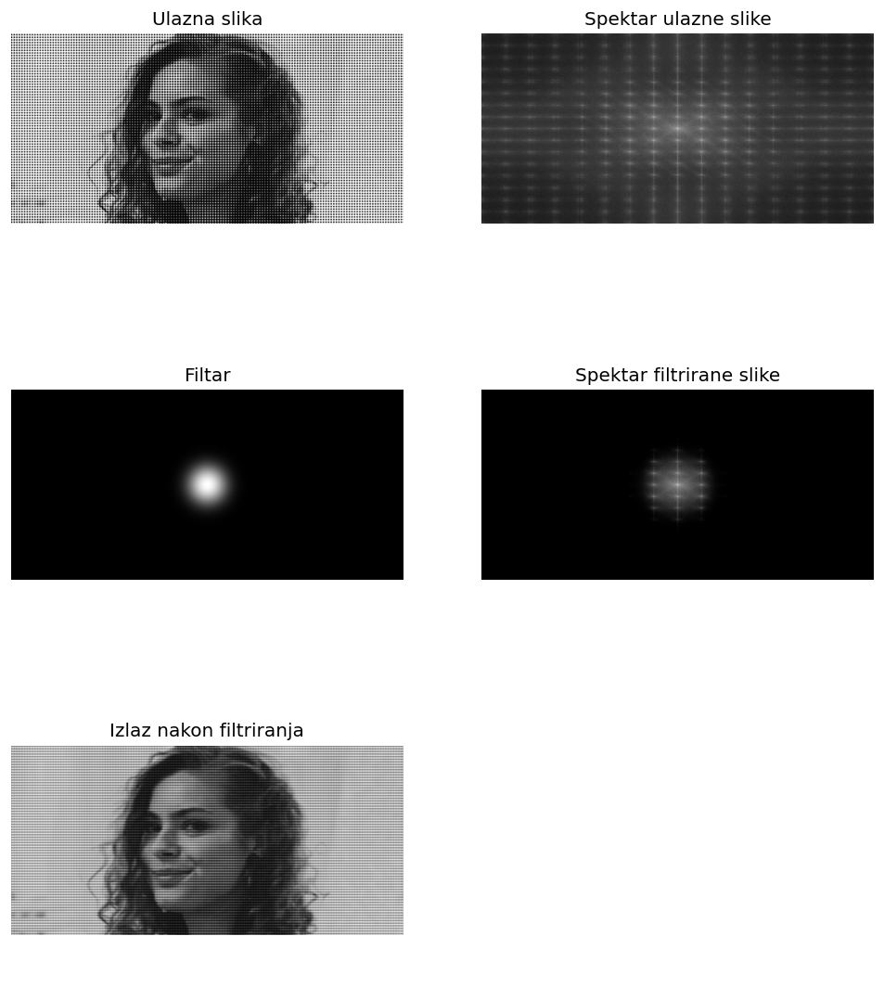

In [9]:
# Applying Gaussian low pass filter
filt_freq_lp = lpfilter('gaussian',Ny, Nx, 75)
(img_filt_lp, img_fft_filt_lp) = plot_filter(img, img_fft, filt_freq_lp)

### Notch filtriranje

In [10]:
# Dots where to apply notch
C = np.array([[Ny//2+Ny//16, Nx//2-Nx//16],[Ny//2+Ny//16, Nx//2+Nx//16],[Ny//2+Ny//16, Nx//2+0],\
              [Ny//2+2*Ny//16,Nx//2-Nx//16],[Ny//2+2*Ny//16,Nx//2+Nx//16],[Ny//2+2*Ny//16, Nx//2+0],
             [Ny//2+3*Ny//16, Nx//2+0],[Ny//2+0,Nx//2-Nx//16]
             ])

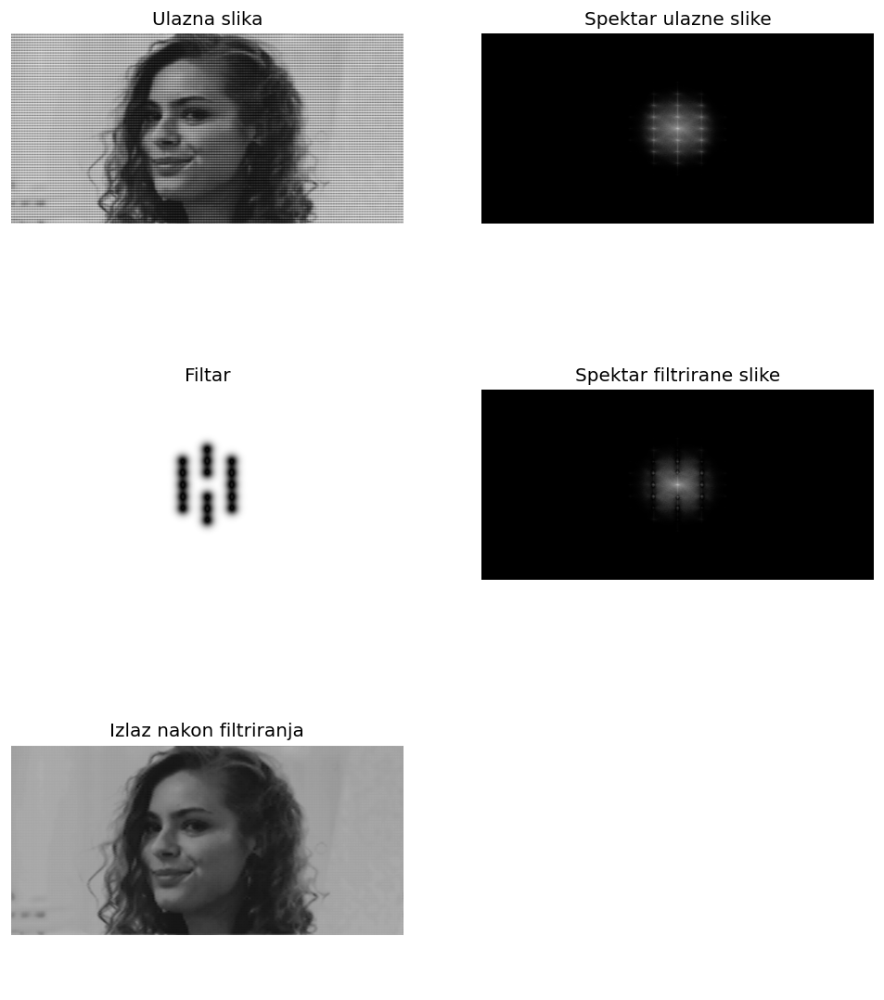

In [11]:
# Applying Gaussian Notch filter
filt_freq_nc_1 = cnotch('gaussian', 'reject', Ny, Nx, C, 30)
(img_filt_nc_1, img_fft_filt_nc_1)  =plot_filter(img_filt_lp, img_fft_filt_lp, filt_freq_nc_1)

### std = 65

Iz navedenih razloga, isprobavanjem, biramo standardnu devijaciju 65 kao najbolje resenje.

### NF filtriranje

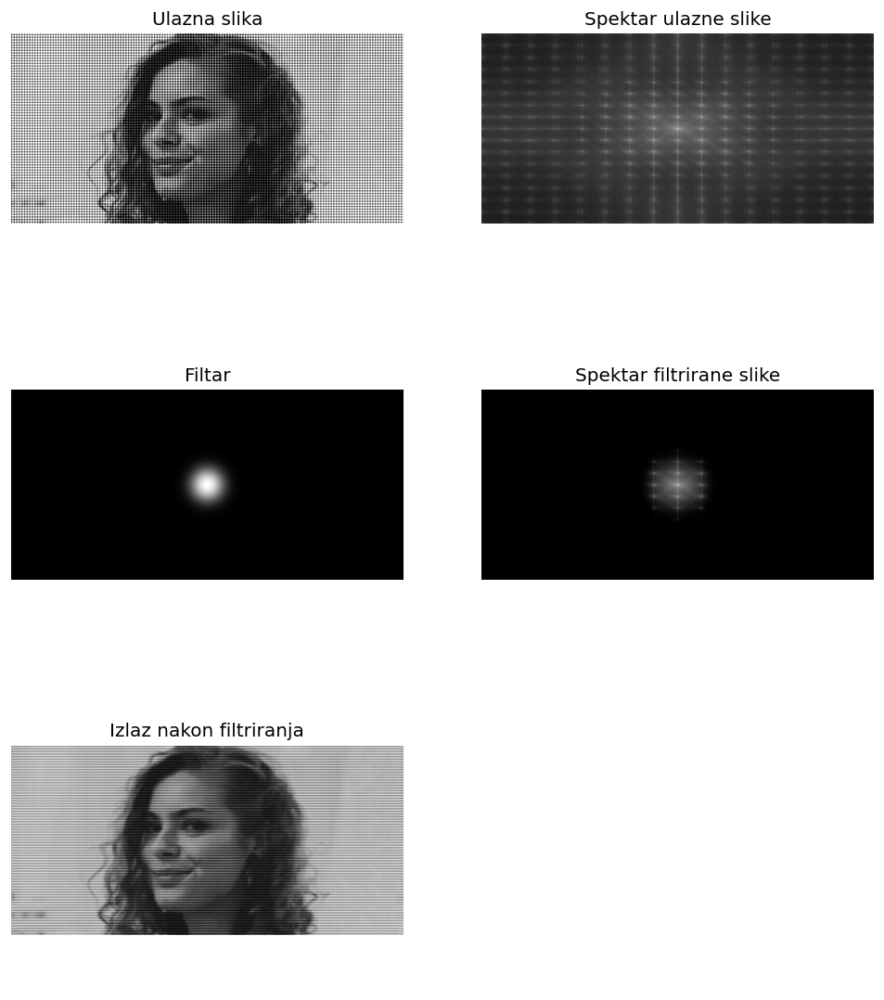

In [12]:
# Applying Gaussian low pass filter
filt_freq_lp = lpfilter('gaussian',Ny, Nx, 65)
(img_filt_lp, img_fft_filt_lp) = plot_filter(img, img_fft, filt_freq_lp)

### Notch filtriranje

In [13]:
# Dots where to apply notch
C = np.array([[Ny//2+Ny//16, Nx//2-Nx//16],[Ny//2+Ny//16, Nx//2+Nx//16],[Ny//2+Ny//16, Nx//2+0],\
              [Ny//2+2*Ny//16,Nx//2-Nx//16],[Ny//2+2*Ny//16,Nx//2+Nx//16],[Ny//2+2*Ny//16, Nx//2+0],
              [Ny//2+3*Ny//16, Nx//2+0],[Ny//2+0,Nx//2-Nx//16]
             ])

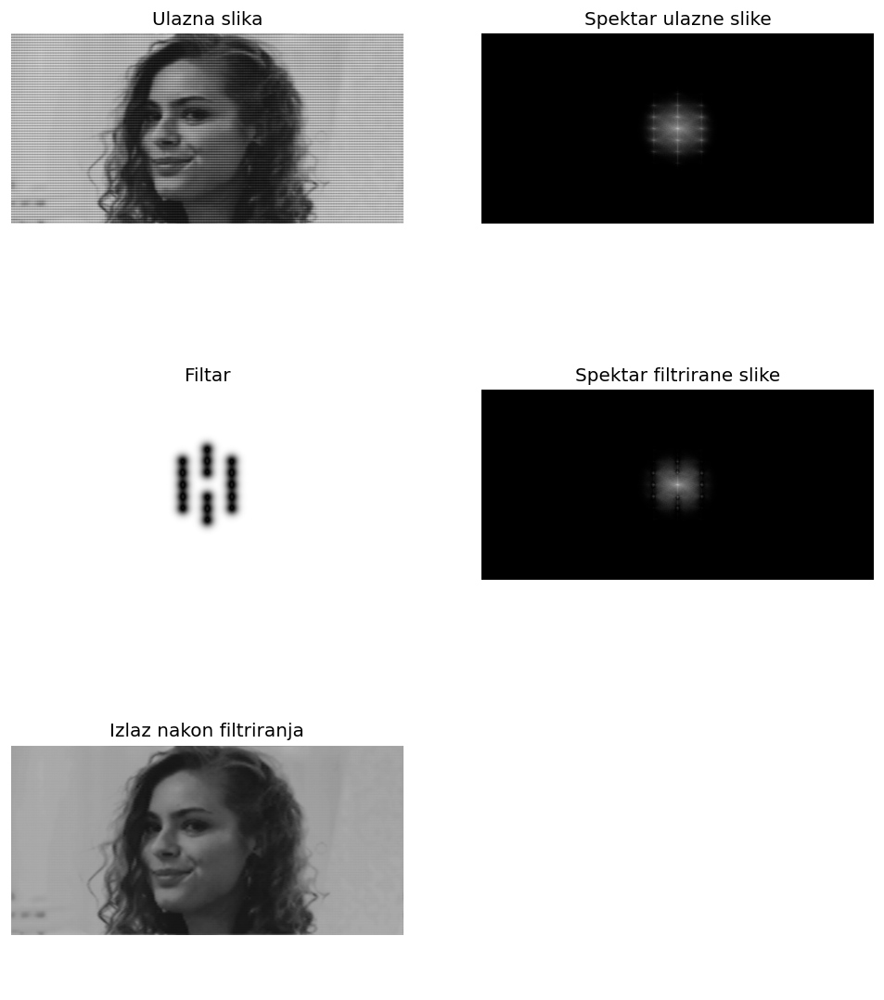

In [14]:
# Applying Gaussian notch filter
filt_freq_nc_3 = cnotch('gaussian', 'reject', Ny, Nx, C, 30)
(img_filt_nc_3, img_fft_filt_nc_3)  =plot_filter(img_filt_lp, img_fft_filt_lp, filt_freq_nc_3)

### sumarni  prikaz rezultata

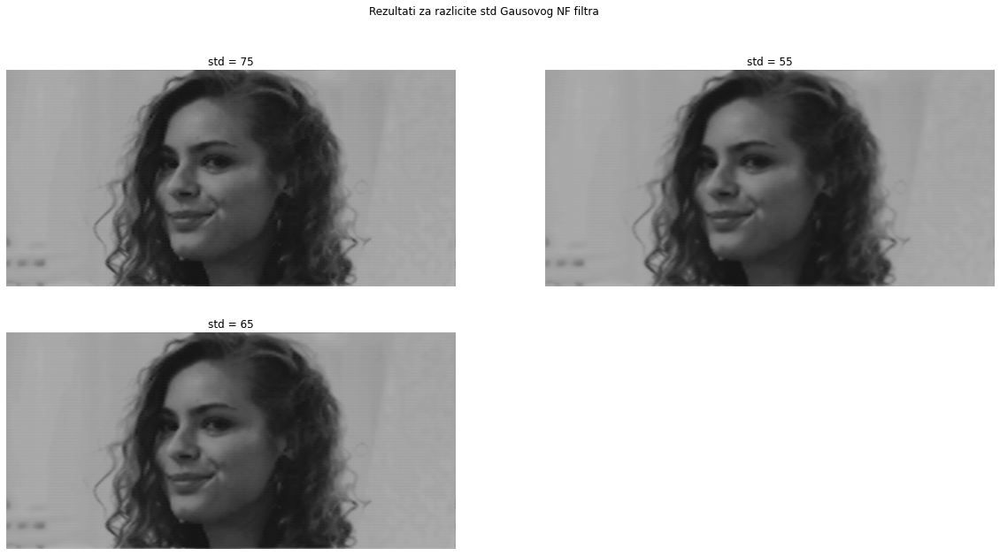

In [15]:
fig, axes = plt.subplots(ncols = 2, nrows = 2, figsize = (20,10))
ax = axes.ravel()
fig.suptitle('Rezultati za razlicite std Gausovog NF filtra')
ax[0].imshow(img_filt_nc_1, cmap='gray', vmin=0, vmax=1); ax[0].axis('off'); ax[0].set_title('std = 75')
ax[1].imshow(img_filt_nc_2, cmap='gray', vmin=0, vmax=1); ax[1].axis('off'); ax[1].set_title('std = 55')
ax[2].imshow(img_filt_nc_3, cmap='gray', vmin=0, vmax=1); ax[2].axis('off'); ax[2].set_title('std = 65')
ax[3].axis('off')
plt.savefig('zad1_1.png')

## 1.2. Isprobavanje Gausovog,  idealnog i Butterwortovog notch filtra

### Idealni

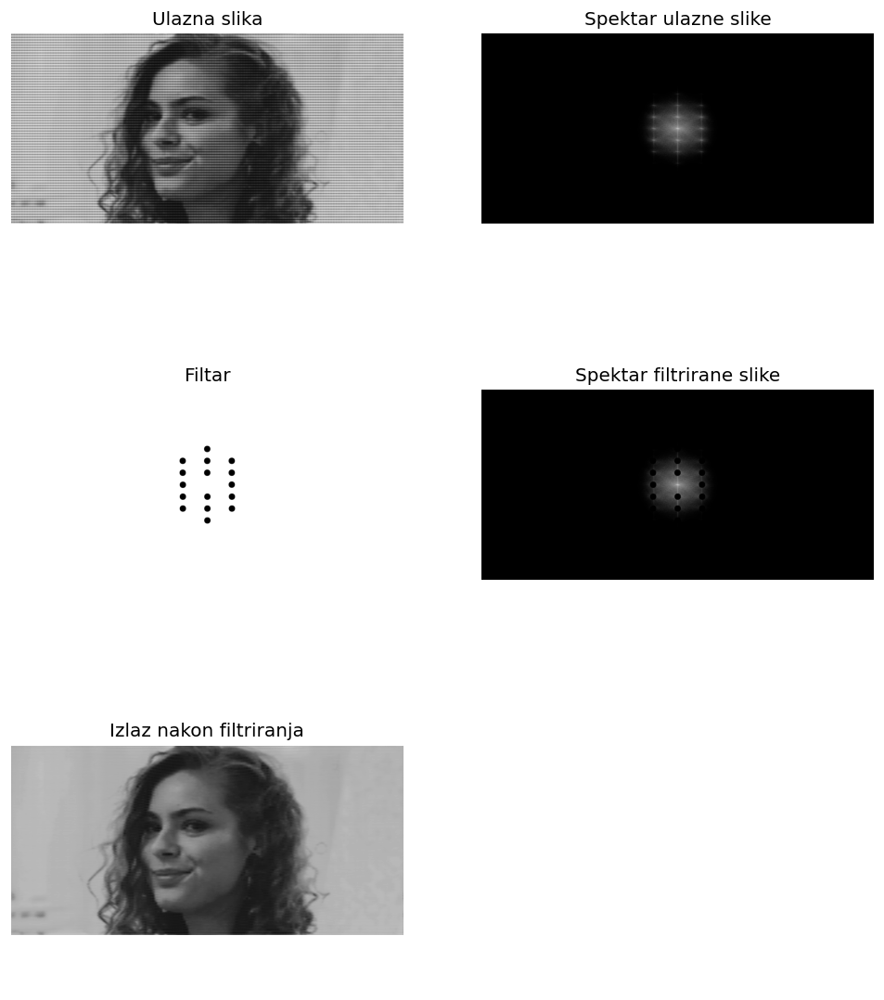

In [16]:
# Applying ideal notch filter
filt_freq_nc_idl = cnotch('ideal', 'reject', Ny, Nx, C, 20)
(img_filt_nc_idl, img_fft_filt_nc_idl)  =plot_filter(img_filt_lp, img_fft_filt_lp, filt_freq_nc_idl)

### Butterwort-ov

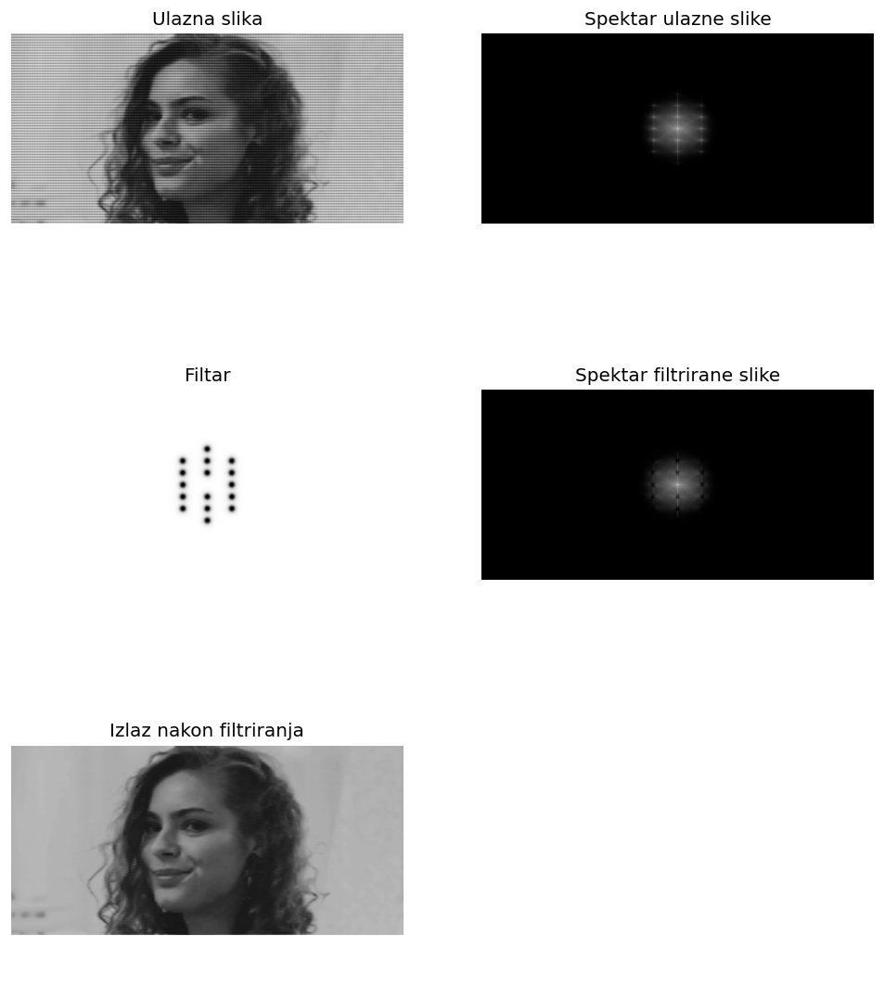

In [17]:
# Applying Butterworth notch filter
filt_freq_nc_btw = cnotch('btw', 'reject', Ny, Nx, C, 20,2)
(img_filt_nc_btw, img_fft_filt_nc_btw)  =plot_filter(img_filt_lp, img_fft_filt_lp, filt_freq_nc_btw)

### Gausov

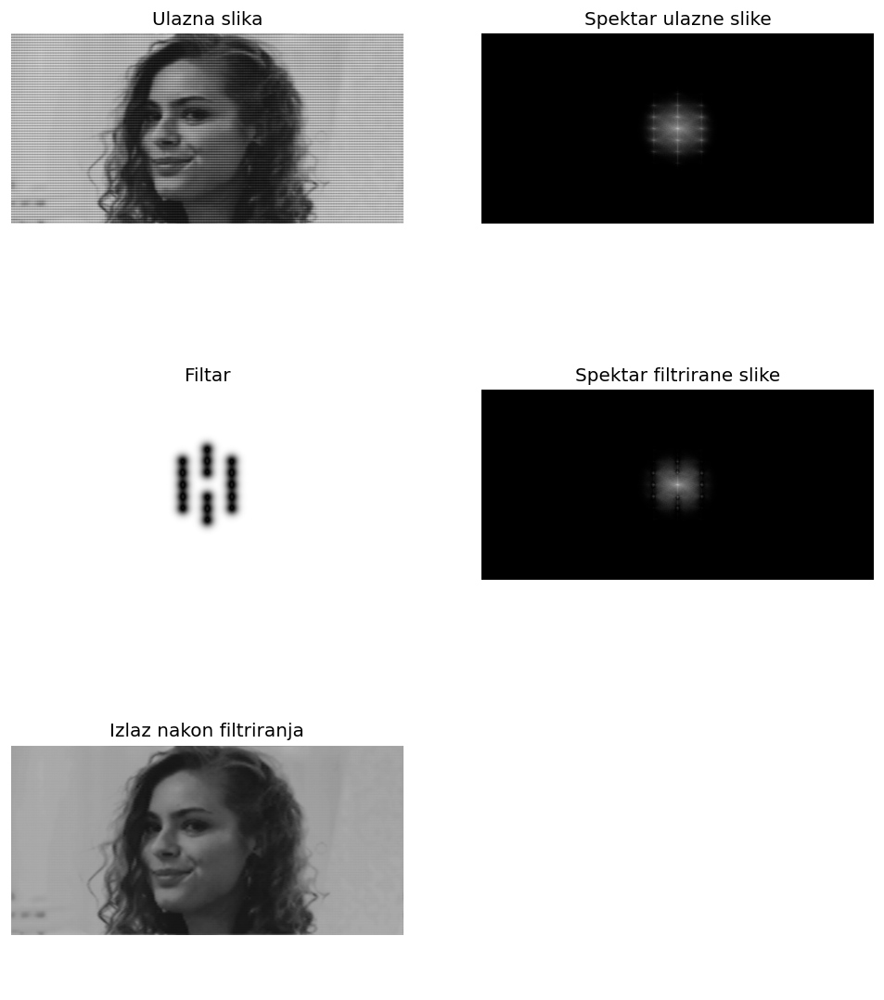

In [18]:
# Applying Gaussian notch filter
filt_freq_nc_gaus = cnotch('gaussian', 'reject', Ny, Nx, C, 30)
(img_filt_nc_gaus, img_fft_filt_nc_gaus)  =plot_filter(img_filt_lp, img_fft_filt_lp, filt_freq_nc_gaus)

### sumarni prikaz rezultata

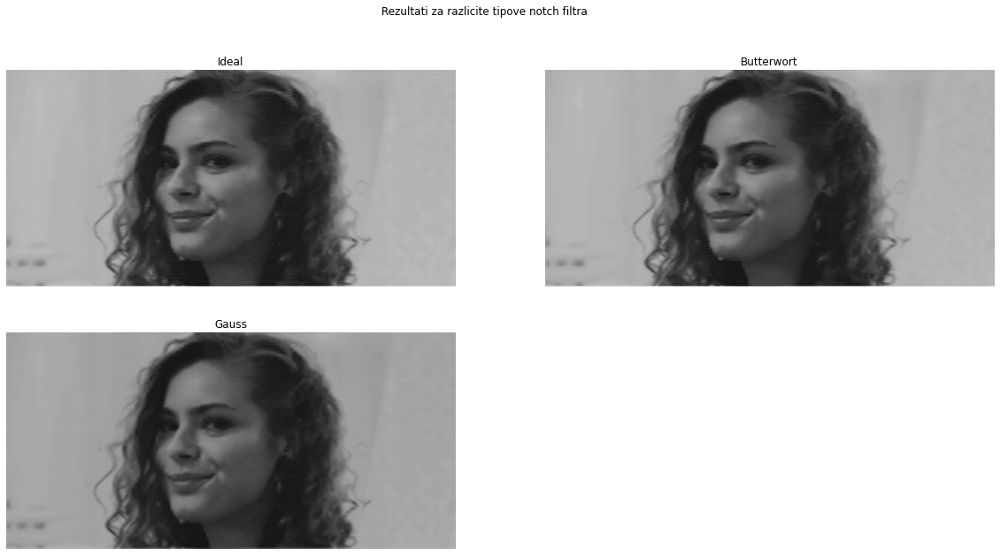

In [19]:
fig, axes = plt.subplots(ncols = 2, nrows = 2, figsize = (20,10))
ax = axes.ravel()
fig.suptitle('Rezultati za razlicite tipove notch filtra')
ax[0].imshow(img_filt_nc_idl, cmap='gray', vmin=0, vmax=1); ax[0].axis('off'); ax[0].set_title('Ideal')
ax[1].imshow(img_filt_nc_btw, cmap='gray', vmin=0, vmax=1); ax[1].axis('off'); ax[1].set_title('Butterwort')
ax[2].imshow(img_filt_nc_gaus, cmap='gray', vmin=0, vmax=1); ax[2].axis('off'); ax[2].set_title('Gauss')
ax[3].axis('off')
plt.savefig('zad1_2.png')

Deluje da svi filtri daju slican razultat, ali ako posmatramo deo lica izmedju kose i brade deluje da Gausov filtar radi za nijansu bolje i iz tog razloga biramo njega.

# Zadatak 2

In [20]:
def gauss_lp_filter( Ny, Nx, sigmax, sigmay, rho = 0):
        '''
            Inputs:
                  Ny - length of image
                  Nx - width of image
                  sigmax - standard deviation of x axis
                  sigmay - standard deviation of y axis
                  rho - coefficient of correlation between axes
            Output:
                  gaussian mask 
                  
            This function is implemented for the most general case of gaussian filter in frequentistic domain assuming that
            axis expectation is zero.
        '''
        # making a grid
        if (Ny%2 == 0):
            y = np.arange(0,Ny) - Ny/2 + 0.5
        else:
            y = np.arange(0,Ny) - (Ny-1)/2
    
        if (Nx%2 == 0):
            x = np.arange(0,Nx) - Nx/2 + 0.5
        else:
            x = np.arange(0,Nx) - (Nx-1)/2

    
        X, Y = meshgrid(x, y)
        # returning expression for gaussian mask in frequentistic domain
        return exp(-(0.5/(1-np.square(rho)))*(np.square(X)/(np.square(sigmax))+np.square(Y)\
                                              /(np.square(sigmay))-2*(rho*X*Y/sigmax/sigmay)))

In [21]:
def wiener_filter(img, img_fft, k, H_deg):
        '''
            Inputs: img - corrupted image
                    img_fft - fft of corrupted image
                    k - exponent of 1/SNR( signal to nois ratio)
                    H_deg - fft of degradation function
            Outputs:
                    img_est - restored image
                    img_fft_est - fourier transform of restored image
        '''
        # argument k is given as an argument of exponent representing constant k in wiener filter
        k = np.exp(k)
        
        # formula for W
        W = (abs(H_deg)**2)/(abs(H_deg)**2 + k)
        
        # fft estimation of original image in frequentistic domain
        img_fft_est = img_fft.copy()
        img_fft_est[:,:,0] = (img_fft[:,:,0]/H_deg)*W
        img_fft_est[:,:,1] = (img_fft[:,:,1]/H_deg)*W
        img_fft_est[:,:,2] = (img_fft[:,:,2]/H_deg)*W

        # fft estimation of original image in spatial domain 
        img_est = real(np.dstack([ifft2(ifftshift(img_fft_est[:,:,0])),\
                                  ifft2(ifftshift(img_fft_est[:,:,1])), \
                                  ifft2(ifftshift(img_fft_est[:,:,2]))]))
        # making sure that image is in the right range
        img_est = np.clip(img_est, 0, 1)
        
        # plotting results
        fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(16,8), dpi=120)
        ax = axes.ravel()

        ax[0].imshow(img, cmap='jet', vmin = 0, vmax = 1);
        ax[0].set_axis_off(); ax[0].set_title('Ulazna slika')
        ax[1].imshow(log(1+abs(img_fft[:,:,0])), cmap='gray', vmin = 0, vmax = 1);
        ax[1].set_axis_off(); ax[1].set_title('Spektar slike R')
        ax[2].imshow(abs(H_deg), cmap='gray', vmin = 0, vmax = 1);
        ax[2].set_axis_off(); ax[2].set_title('Spektar degradacione funkcije')
        ax[3].imshow(log(1+abs(img_fft_est[:,:,0])), cmap='gray', vmin = 0, vmax = 1);
        ax[3].set_axis_off(); ax[3].set_title('Spektar nakon Vinerovog filtra R')      
        ax[4].imshow(img_est,cmap = 'jet', vmin = 0, vmax = 1);
        ax[4].set_axis_off(); ax[4].set_title('Estimirani izlaz');
        ax[5].set_axis_off()
        # returning results
        return(img_est, img_fft_est);

In [22]:
# reading image
img = skimage.img_as_float(imread('../sekvence/road_blur.png'))
# fft of rgb image
img_fft = np.dstack([fftshift(fft2(img[:,:,0])),fftshift(fft2(img[:,:,1])),fftshift(fft2(img[:,:,2]))])
# reading shape of image
[Ny, Nx, C] = shape(img)

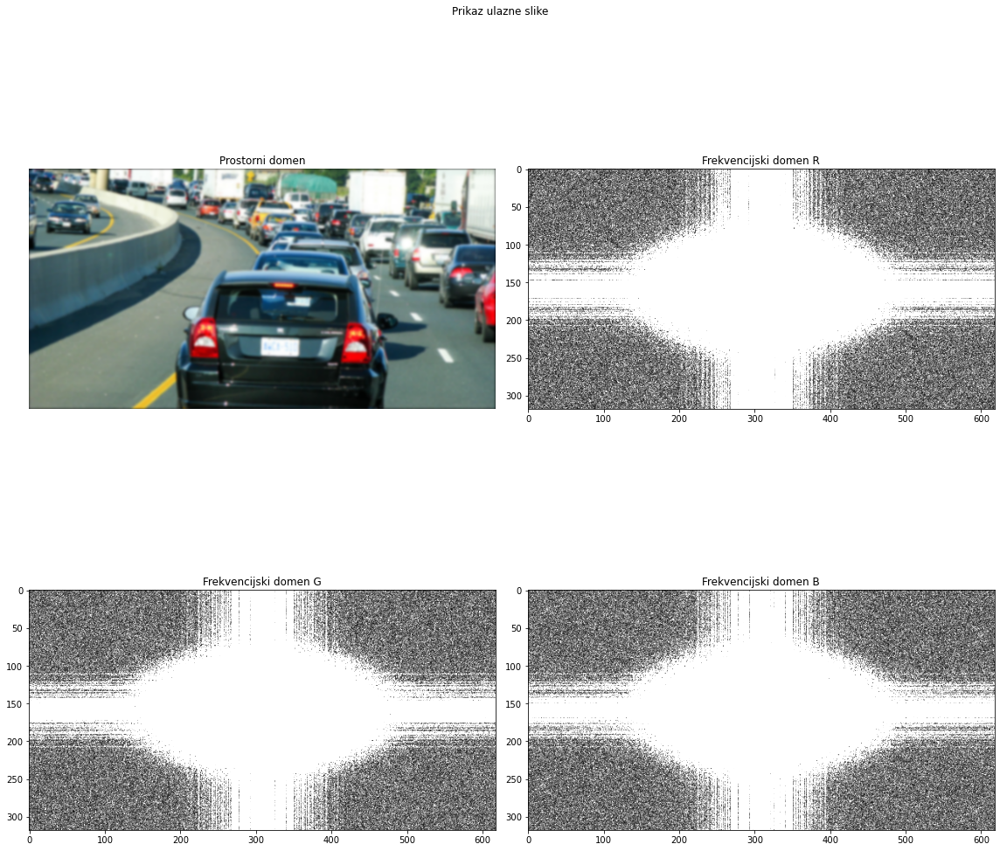

In [23]:
fig, axes = plt.subplots(ncols = 2, nrows = 2,figsize = (16,16))
ax = axes.ravel()
fig.suptitle('Prikaz ulazne slike')
ax[0].imshow(img,cmap = 'jet', vmin = 0, vmax = 1); ax[0].set_title('Prostorni domen'); ax[0].set_axis_off();
ax[1].imshow(abs(img_fft[:,:,0]),cmap = 'gray', vmin = 0, vmax = 1); ax[1].set_title('Frekvencijski domen R'); 
ax[2].imshow(abs(img_fft[:,:,1]),cmap = 'gray', vmin = 0, vmax = 1); ax[2].set_title('Frekvencijski domen G'); 
ax[3].imshow(abs(img_fft[:,:,2]),cmap = 'gray', vmin = 0, vmax = 1); ax[3].set_title('Frekvencijski domen B'); 
plt.tight_layout()

Posmatranjem ulazne slike bitno je primetiti par stvari. 
* Nas spektar nije nakosen vec je paralelan horizontali i vertikali sto znaci da je korelacija izmedju osa jednaka nuli. 
* Spektar je oblika elipse sto znaci da standardna devijacija gausove raspodele nije ista po x i po y osi jer bi inace bio oblika kruga.
* Ove standardne devijacije mozemo odrediti deljenjem sirina elipse po x i y osi sa 6 da bismo obuhvatili 3-sgima interval jer znamo da nakon njega signal iscezava.
* Sve tri kompoonente imaju skoro identicni spektar tako da je u redu vrsiti iste transformacije nad njima.

Iz ovih razloga procenjujemo da je sigmay = (260-60)/6 = 33, sigmax = (500-100)/6 = 66, i pozivamo funkciju za najopstiji oblik gausovog filtra sa ovim parametrima

In [24]:
H_deg = gauss_lp_filter(Ny, Nx, 66, 33 )

Jedan od metoda restauracije sllike je inverzno filtriranje kojim se prostim deljenjem spektra sa spektrom degradacione funkcije dobija estimacija originalne slike. Problem sa ovakvim pristupom je to sto za male vrednosti degradacione funkcije sum delimo sa jako malim brojem cime ga pojacavamo, i zato se nakon toga primenjuje niskofrekventan filtar. Ipak, problem je sto prilikom primene niskofrekventnog filtra dobijamo artefakte jer je filtar idealan, a cak i da ne koristimo idealan filtar male vrednosti H mogu se desiti i na nizim ucestanostima i tada ovo ne bi bilo adekvatno resenje. Kompromis izmedju zahteva da sto vise rekonstruisemo sliku a da nam ne iskoce artifakti nam daje Vinerov filtar.

Vinerov filtar minimizuje srednje kvadratnu gresku koja nastaje pri inverznom filtriranju u prisustvu suma. U njemu figurise SNR faktor koji nam u realnosti nije poznat jer cesto nemamo spektar snage originalnog signala niti suma, pa se on znamenjuje sa konstantom 1/K.

* Sto je K manje vinerov filtar je blizi inverznom filtriranju ali i veca je verovatnoca da ce da nam eksplodira sum na slici.
* Sto je K vece to je slika vise zamucena i manje se vidi efekat uklanjanja degradacije ali smo sigurniji od pojave artifakata

S obzirom da je cilj ovog zadatka da slika nakon popravke bude sto ocuvanija ali da moze da se procita tablica zaustavicemo se na najvecem K za koje moze da se procita tablica, a na ustrb citanja tablice imacemo mala ostecenja po ivici slike.

Napomena: K iz formule za Vinerov filtar je zapravo exp(k) kojeg prosledjujemo funkciji jer je bilo lakse za eksperimentisanje u interaktivnom modu prilikom biranja parametra

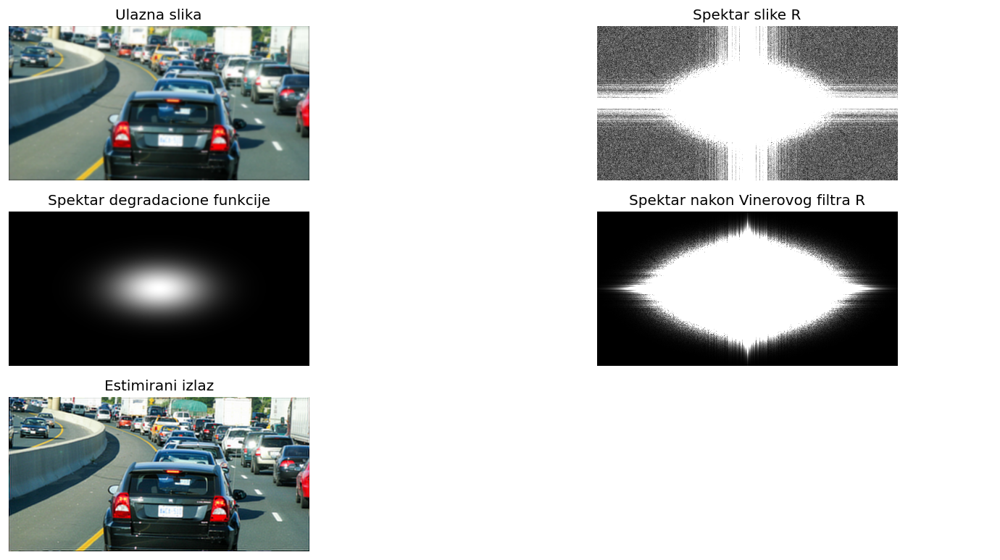

In [25]:
(img_wiener, img_wiener_filt) = wiener_filter(img,img_fft,-5,H_deg)
#interact(wiener_filter,img =  fixed(img), k = (-10,0,0.5), H_deg = fixed(H_deg_2))

Slika koju smo dobili je dosta dobra i tablica moze doovljno da se procita ali su ivice slike na ustrb toga malo ostecene. Mozemo pokusati da dodatno popravimo kvalitet slike popravkom kontrasta i filtriranjima.

In [26]:
def band_pass_sharpen(img_in, limit):
        '''
        inputs: img_in - image to be sharpened
                limit - starting radius of band pass filter
        output: sharpened image
        
        Sharpening of image with band pass filter and contrast enhancement.
            
        ''' 
        # form rgb to yuv
        img_yuv = skimage.color.rgb2yuv(img_in)
        img_y = img_yuv[:,:,0]
        img_fft = fftshift(fft2(img_y))
        # two law pass filteres
        lp1_filter_freq = lpfilter('ideal', Ny, Nx, limit)
        lp2_filter_freq = lpfilter('ideal', Ny, Nx, limit+5)
        # creating band reject fielter
        br_filter_freq = 1 - lp1_filter_freq + lp2_filter_freq
        # finding spectrum of sharpened image 
        img_fft_filt = img_fft*br_filter_freq
        # spatial domain of sharpened image
        img_filt = real(ifft2(ifftshift(img_fft_filt)))
        # making sure that output is in the right range
        img_filt = np.clip(img_filt, 0, 1)
        # back to rgb
        img_out_filt = img_yuv.copy()
        img_out_filt[:,:,0] = img_filt
        # contrast enhancement with gamma transform
        img_filt_enhanced =  skimage.exposure.adjust_gamma(img_y, gamma=1.3, gain=1)
        # back to rgb
        img_out_filt_enhanced = img_yuv.copy()
        img_out_filt_enhanced[:,:,0] = img_filt_enhanced
    
        # plotting results
        fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(14,12), dpi=120)
        ax = axes.ravel()
        
        ax[0].imshow(img_in, cmap='jet'); ax[0].set_axis_off(); ax[0].set_title('Ulazna slika')
        ax[1].imshow(np.clip(skimage.color.yuv2rgb(img_out_filt),0,1), cmap='jet', vmin=0, vmax=1); ax[1].set_axis_off(); ax[1].set_title('Izlaz nakon filtriranja')
        ax[2].imshow(np.clip(skimage.color.yuv2rgb(img_out_filt_enhanced),0,1), cmap='jet', vmin=0, vmax=1); ax[2].set_axis_off(); ax[2].set_title('Izlaz nakon popravke kontrasta');
        ax[3].imshow(log(1+abs(img_fft)), cmap='gray'); ax[3].set_axis_off(); ax[3].set_title('Spektar ulazne slike')
        ax[4].imshow(log(1+abs(br_filter_freq)), cmap='gray'); ax[4].set_axis_off(); ax[4].set_title('Filtar')
        ax[5].imshow(log(1+abs(img_fft_filt)), cmap='gray'); ax[5].set_axis_off(); ax[5].set_title('Spektar filtrirane slike')
        
        # returning image after contrast and sharpening
        return np.clip(skimage.color.yuv2rgb(img_out_filt_enhanced),0,1)

Pokusavanjem izostravanja raznih delova spektra primecujemo da kada dodjemo u deo gde su nam slova pojacana pojacan je previse sum a povecanjem u vise ucestanosti ne uspevamo da dobijemo izostrenija slova, pa je ovaj problem skoro nemoguce zaobici iz tog razloga izostravanje u ovom slucaju ne pomaze puno. Ipak, poboljsanje kontrasta pomocu gamma transformacije je malo potamnelo slova cime malo vise dolaze do izrazaja pa cemo iz tog razloga ovu transformaciju zadrzati i izabrati ovo kao konacnu sliku

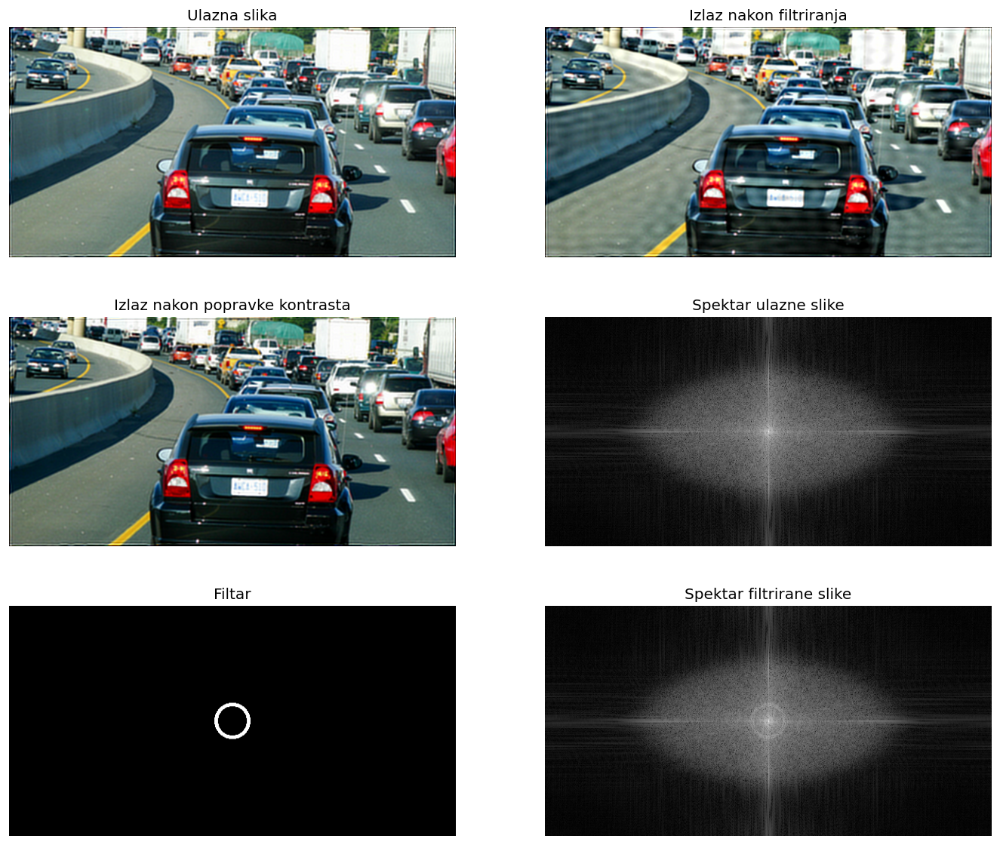

In [27]:
img_out = band_pass_sharpen(img_wiener,20)

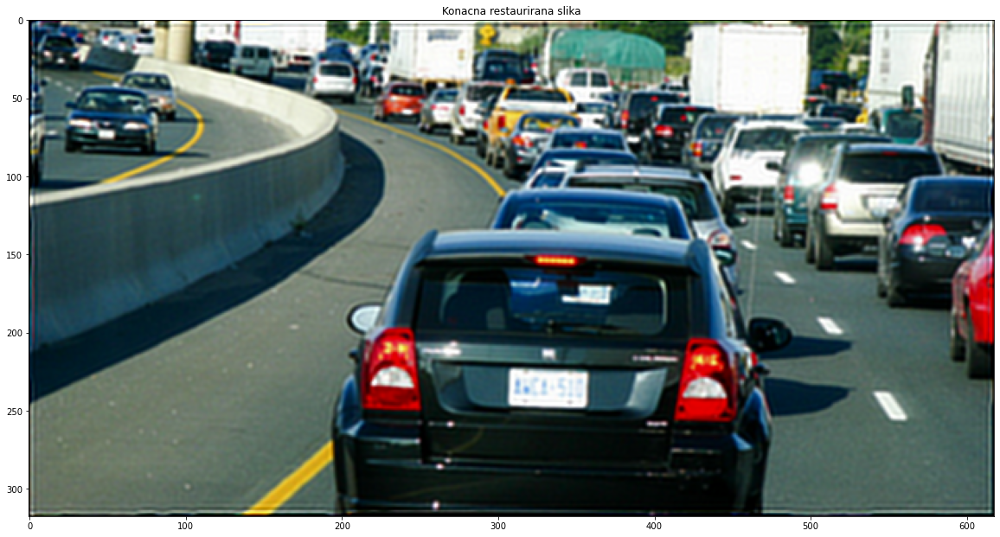

In [28]:
plt.figure(figsize = (20,20))
plt.title('Konacna restaurirana slika')
plt.imshow(img_out, cmap = 'jet',vmin = 0, vmax = 1)

# Zadatak 3

Adaptivni mediana filtar se koristi da bi se napravio kompromis izmedju sto boljeg uklanjanja impulsnog suma i ocuvanja detalja slike tako sto se za svaki piksel bira najmanji prozor koji se moze primeniti tako da se ukloni sum jer sto je manji prozor to ce ostatak slike vise  biti ocuvan, ali ako se u okolini ostecenog piksela nalazi previse losih piksela koje sve treba zameniti moze se desiti da nam treba velik prozor, a ne zelimo da zbog jedne grupacije ovakvih piksela primenjujemo velik prozor na sve piksele slike i ostetimo sve detalje vec ga koristimo samo u delu gde nam je potreban.<br>
Nakon sto se izabere velicina prozora los piksel se zamenjuje medianom prozora. Za implementaciju ove metode koristicemo strukturu podataka heap. Postoje min i max heap. Heap prakticno predstavlja niz u kome je smesteno binarno stablo tako sto je prvi element koren stabla sledeca dva njegovo levo i desno dete pa onda leva i desna deca levog i desnog deteta i tako rekurzivno. Minimalni heap podrazumeva da je svaki otac manji od svoje dece dok maksimalni heap podrazumeva da je svaki otac veci od svoje dece. Ovakav poredak podataka obezbedjuje da prvi element bude minimum odnosno maksimum svih elemenata niza. U Pythonu ne postoji maksimalni heap vec samo minimalni pa cemo maksimalni heap realizovati tako sto cemo u njega smestati negativne vrednosti cime cemo na vrhu imati minimalnu negativnu vrednost sto je zapravo maksimum.

Ova struktura podata moze da se koristi za nalazenje mediane u real-time-u tako sto cemo imati dva heap-a. U prvom ce nam biti uvek smestena prva polovina sortiranog niza podataka, tj elementi niza koji su manji ili jednaki mediani, a u drugom heap-u cemo cuvati drugu polovinu sortiranog niza tj. elemente niza koji su veci od mediane. Ako imamo neparan broj elemenata jedan od njih ce imati za jedan vise element. Kada imamo neparan broj elemenata mediana ce nam biti maksimum prvog heap-a jer ce on biti max heap, ili minimum drugog heap-a jer ce on biti min heap u zavisnosti od toga koji od njih ima element viska, a kada imamo paran broj elemenata mediana ce nam biti aritmeticka sredina minimuma drugog heap-a i maksimuma prvog heap-a.

Dodavanje novog podatka tako da se odrzi definisani poredak se vrsi tako sto ako je heap prazan stavljamo prvi element u lower heap. Ako je novi element veci od maksimuma lower heap-a onda pripada gornjem heapu, a u suprotnom donjem. Nakon dodavanja novog elementa treba proveriti da li je razlika duzina postala jednaka 2. Ako imamo vise elemenata u lower heap-u koji je maksimalan i sadrzi manju polovinu onda treba njegov maksimum prebaciti u upper heap jer on sadrzi vecu polovinu. U suprotnom treba uraditi obrnuto. Na ovaj nacin smo sigurni da je nakon svakog ubacivanja elementa maksimalna razlika u duzini jednaka jedan.

Minimume i maksimume cuvamo kao posebna polja i apdejtujemo pri svakom dodavanju elementa.

S obzirom da je neophodno sortirati elemente nekako da bi se dobila mediana, a svako sortiranje zahteva slozenost O(nlogn) pa slozenost ne moze biti ispod ove. Cak i da nakon toga radimo binarnu pretragu umesto sortiranja iznova pri svakom dodavanju elementa, nakon sto nadjemo mesto gde treba staviti element sto zahteva O(logn) idalje moramo ubaciti taj element u niz sto ima slozenost O(n). Ako koristimo liste ne mozemo raditi binarnu pretragu tako da nemamo bolji nacin da ovo izvedemo. Algoritam koji smo ovde koristili ima mnogo manju slozenost jer je slozenost dodavanja u jedan od heap-ova O(log(n/2)) a slozenost dodavanja u jedan od heap-ova pa balansiranja O(2*log(n/2)) cime ukupna slozenost naseg algoritma ostaje O(nlogn) sto je najbolja moguca slozenost koja moze da se dobije za dati problem.

### Klasa za efikasno racunanje mediane, minimuma i maksimuma u real time-u

In [29]:
class keep_precentiles:
        '''
            Class for optimally finding median min and max in real time
            Class fields:
            
            min - current minimum of all numbers inserted
            max - current maximum of all numbers inserted
            lower_heap - maximum heap storing first half of sorted array of all numbers
            upper_heap - minimum heap storing second half of sorted array of all numbers
            
        '''
        # defining constructor of a class
        def __init__(self, elements):
                '''
                   Inputs:
                          elements - numbers to insert into heaps
                   Constructor of class. 
                '''
                # setting minimum as maximum possible uint8 value
                self.min = 2**8
                # setting maximum as zero
                self.max = 0
                # lower heap is heap in which will be stored elements smaller than median
                # it is configured as max heap, so first element will be maximum 
                self.lower_heap = []
                # upper heap is heap in which will be stored elements greater than median
                # it is configured as min heap, so first element will be minimum
                self.upper_heap = []
                # storing elements in heap
                self.add_elements(elements)
        def add_elements(self, elements):
            '''
                Method which adds elements element by element 
                
                Inputs:
                     elements - elements to be added
            '''
            # storing elements one by one in heaps
            for element in elements:
                  self.add_element(element)
        # adding one element in heaps
        def add_element(self,element):
                '''
                   Inputs:
                      element - element to be added
                   Method which adds new elements while maintaining all given rules, and updates min and max.
                '''
                # if element is smaller than minimum thatn update minimum
                if(element<self.min):
                      self.min = element
                # if element is greater than maximum than update maximum
                if(element>self.max):
                      self.max = element
                # if element is greater than maximum element in lower heap than it is in 
                # upper heap
                if(len(self.lower_heap) and element>(-self.lower_heap[0])):
                      heappush(self.upper_heap,element)
                else:# otherwise it is in lower heap
                     heappush(self.lower_heap,-element)
                # if some heap is bigger balance heaps       
                if(abs(len(self.lower_heap)-len(self.upper_heap))>1):
                    # in case it is lower heap transfer its biggest element to upper heap
                    if(len(self.lower_heap)>len(self.upper_heap)):
                          heappush(self.upper_heap, - heappop(self.lower_heap))
                    else:# otherwise transfer smaller element from upper to lower heap
                        heappush(self.lower_heap, - heappop(self.upper_heap))
                        
        def get_precentiles(self):
            '''
                Outputs:
                     (median, min, max)
                Mathod for returning 0.5, 0, 1 precentiles
            '''
            # getting median, min and max
            N = len(self.lower_heap)+len(self.upper_heap)
            # if number of elements is odd number median is in the middle
            if(N%2 == 1):
                # if lower heap has one element more than upper heap median is its maximum value
                if(len(self.lower_heap)> len(self.upper_heap)):
                         return (-self.lower_heap[0], self.min,self.max)
                else:# otherwise median is upper heap minimum value
                         return (self.upper_heap[0],self.min,self.max)
            # if number of elements is even median is aritmetic mean of middle elements
            else:
                # if heap is empty return zero
                if((len(self.lower_heap) == 0) and len(self.upper_heap) == 0):
                    return (0, self.min, self.max)
                else: #otherwise return aritmetic mean 
                    return ((self.upper_heap[0]-self.lower_heap[0])/2, self.min, self.max)

### Demonstriranje rada klase keep_precentiles

In [30]:
W=keep_precentiles([5,1,3,7,15,12,1])

In [31]:
# lower heap is storing negation of lower half of array
W.lower_heap

[-5, -1, -3, -1]

In [32]:
# upper_heap is storing upper half of array
W.upper_heap

[7, 12, 15]

In [33]:
# (median, min, max)
W.get_precentiles()

(5, 1, 15)

In [34]:
W.add_elements([6,2,13,8,4])

In [35]:
# we can see that every parent is bigger or equal to its children compared by absolute value
W.lower_heap

[-5, -2, -4, -1, -1, -3]

In [36]:
# we can see that every parent is smaller or equal to its children
W.upper_heap

[6, 7, 8, 12, 13, 15]

In [37]:
# median is (5+6)/2 -> it is working for floats
W.get_precentiles()

(5.5, 1, 15)

### Nalzanje optimalnog prozora i njegove mediane, minimuma i maksimuma

Krecemo od prozora 3x3 i njegov sadrzaj cuvamo u implementiranoj klasi. Ako utvrdimo da treba da se poveca velicina prozora nema potrebe da ponovo ubacujemo iznova sve elemente vec je doovoljno da dodamo okvir koji je razlika prethodnog i trenutnog prozora jer smo prethodni prozor vec uneli. To radimo tako sto prvo dodamo prvi i poslednji red a zatim prvu i poslednju kolonu bez prvog i poslednjeg elementa jer su oni vec uneti pri unosu prvog i poslednjeg reda.

Ovaj postupak se ponavlja sve dok je mediana jednaka nekoj od ekstremnih vrednosti ili dok nismo dostikli maksimalnu dozvoljenu velicinu prozora. Takodje, treba paziti na to da ne izadjemo iz okvira slike, pa iz tog razloga pre pozivanja ove funkcije padd-ujemo sliku simetricno da bismo resili problem ivicnih piksela

In [38]:
def find_precentiles(J,Smax,i,j, upleft):
    '''
        Inputs:
            I - image: uint8 or double
            Smax - maximum number of elements in window
            i - row coordinate of pixel
            j - column coordinate of pixel
        Outputs:
            (median, minimum, maximum) in window with optimal size
        Function for finding size of minimum window and median.
    '''
    # starting from window with edge of length 2*1+1 -> 3
    [M,N] = J.shape
    l = 1;
    # constructing object of class keep_precentiles to keep median, min and max of all elements in current window
    # (0,0) in I is (upleft,upleft) in J 
    W = keep_precentiles(J[(i-l+upleft):(i+1+1+upleft), (j-l+upleft):(j+l+1+upleft)].ravel())
    # returning precentiles for window 3x3
    (zmed, zmin, zmax) = W.get_precentiles()
    # increase window size while size of window is smaller than Smax and median is equal to some of extreme values
    while( (2*l+1)<Smax and (zmed == zmin or zmed == zmax) ):
            # increase length of window edge
            l +=1;
            # add first row of window 
            W.add_elements(J[(i-l+upleft),(j-l+upleft):(j+l+1+upleft)])
            # add last row of window
            W.add_elements(J[(i+l+upleft),(j-l+upleft):(j+l+1+upleft)])
            # add first column of window except first and last element ( because they were included in rows)
            W.add_elements(J[(i-l+1+upleft):(i+l+upleft),(j-l+upleft)])
            # add last column of window except first and last element ( because they were included in rows)
            W.add_elements(J[(i-l+1+upleft):(i+l+upleft),(j+l+upleft)])
            # update median, min and max
            (zmed, zmin, zmax) = W.get_precentiles()  
    # return final median min and max
    return (zmed, zmin, zmax)

**Dekomnstracija paddovanja slike simetricno**

In [39]:
A = np.array([[1,2,3],[4,5,6],[7,8,9]])

In [40]:
np.pad(A,A.shape, 'symmetric')

array([[9, 8, 7, 7, 8, 9, 9, 8, 7],
       [6, 5, 4, 4, 5, 6, 6, 5, 4],
       [3, 2, 1, 1, 2, 3, 3, 2, 1],
       [3, 2, 1, 1, 2, 3, 3, 2, 1],
       [6, 5, 4, 4, 5, 6, 6, 5, 4],
       [9, 8, 7, 7, 8, 9, 9, 8, 7],
       [9, 8, 7, 7, 8, 9, 9, 8, 7],
       [6, 5, 4, 4, 5, 6, 6, 5, 4],
       [3, 2, 1, 1, 2, 3, 3, 2, 1]])

In [41]:
def dos_adaptmedian(I, Smax):
    ''' Inputs:
            I - image: double or uint8
            Smax - maximum allowed size of window
        Outputs:
            J - corrected image after applying adaptive median filter
        Final function for adaptive median filter implementation
    '''
    # checking for input errors
    if(not(I.ndim==2)):
        raise ValueError("Slika nije siva ili ima lose dimenzije")
    if(I.dtype!=uint8 and I.dtype!=double):
        raise TypeError("Sadrzaj slike nije dobrog tipa")
    if(I.dtype == double and (np.max(I)>1 or np.min(I)<0)):
        raise ValueError("Slika je tipa double a nije u opsegu 0 do 1")
    if(Smax%2 == 0):
        raise ValueError("Maksimalna velicina prozora mora biti neparan broj")
    # there is no need to increase size of filter above size of window
    # it is more efficient to clip it to size of window
    if(Smax > np.size(I)):
        Smax = np.size(I)
    if(I.dtype==uint8):
        I = skimage.img_as_float(I)

    # getting shape of image
    [M, N] = I.shape[:2]
    # Creating copy of image with padded edges
    upleft = (Smax-1)//2
    # Padding image for maximum window size
    J = np.pad(I,(upleft,upleft), mode = 'reflect')
    
    # going through all pixels but it has to be shifted for Smax
    for i in range(0, M):
        for j in range(0,N):
            # getting median min and max for optimal window
            (zmed, zmin, zmax) = find_precentiles(J, Smax,i,j, upleft) 
            # if pixel value is extreme replace it with median
            if(J[i+upleft,j+upleft]==zmax or J[i+upleft,j+upleft]==zmin):
                J[i+upleft,j+upleft] = zmed
    return J[upleft:(upleft+M), upleft:(upleft+N)]

### Demonstracija rada funkcije i dobijenih rezultata

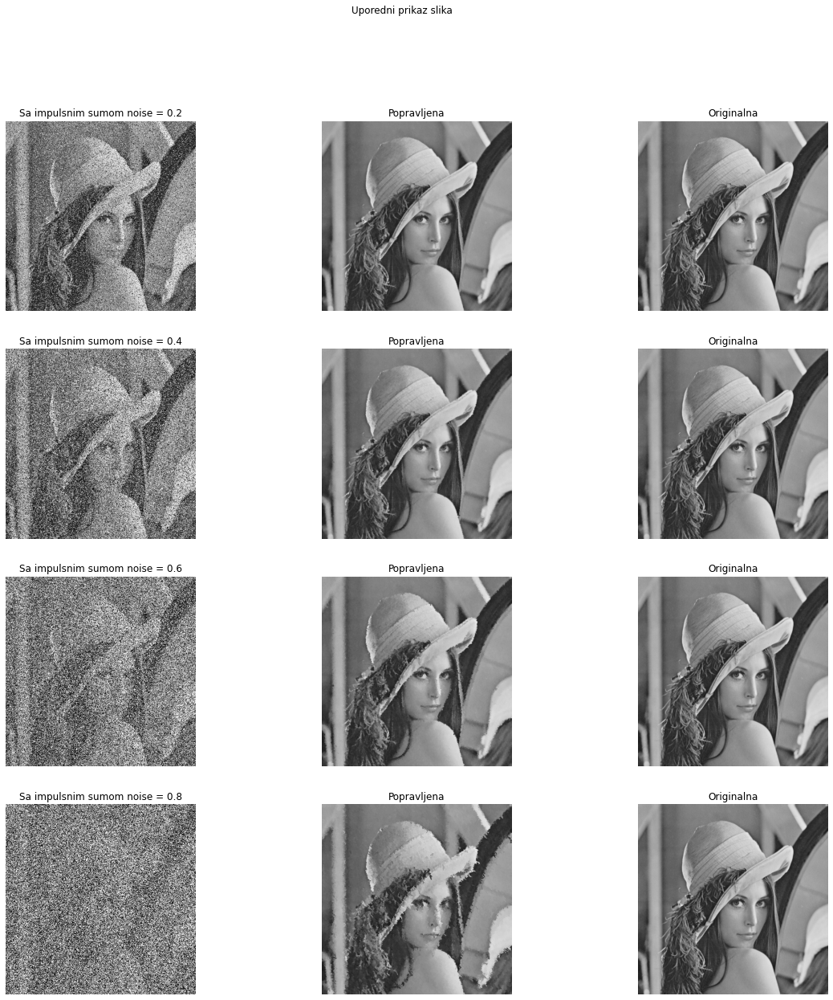

In [42]:
img = skimage.img_as_float(imread('../sekvence/lena.tif'))
noise = [0.2, 0.4, 0.6, 0.8]

corrected = []
fig, axes = plt.subplots(nrows = 4, ncols = 3,figsize = (20,20))
fig.suptitle('Uporedni prikaz slika')
ax = axes.ravel()
for i in range(0,4):
    img_impulse_noise = skimage.util.random_noise(img, mode='s&p', amount=noise[i])
    img_corrected = dos_adaptmedian(img_impulse_noise, 21)
    ax[3*i].imshow(img_impulse_noise,cmap = 'gray', vmin = 0, vmax = 1); 
    ax[3*i].set_title('Sa impulsnim sumom noise = '+str(noise[i]))
    ax[3*i].axis('off');
    
    ax[3*i+1].imshow(img_corrected,cmap = 'gray', vmin = 0, vmax = 1)
    ax[3*i+1].set_title('Popravljena')
    ax[3*i+1].axis('off');
    
    ax[3*i+2].imshow(img,cmap = 'gray', vmin = 0, vmax = 1)
    ax[3*i+2].set_title('Originalna')
    ax[3*i+2].axis('off');

Primetimo da kada je slika zasumljena manje od 50% dobijen je skoro savrsen rezultat ali kada procenat suma pocinje da raste dobijamo dosta pogorsan rezultat u odnosu na prethodne ali idalje radi dosta dobro s obzirom na procenat suma. Razlog ovome je to sto sa povecavanjem procenta suma povecava se i potrebna velicina prozora, ali takodje i broj piksela koje ne znamo i njihovih grupisanih klastera postaje sve veci i prakticno je nemoguce naci koja je prava vrednost tih piksela jer nemamo dovoljno informacija na slici koje bi nam to rekle.

Ipak treba naglasiti da su i ovi rezultati jako dobri jer u situaciji kada imamo vise od 50% impulsnog suma na slici to znaci da veci deo slike cini sum nego sam sadrzaj i da je jako tesko rekonstruisati pravu sliku.

**Dodatak: korisnicka implementacija strukture heap**

Izvor: Predavanja i vezbe iz predmeta algoritmi i strukture podataka, sajt Geeks for geeks.

In [43]:
class My_Min_Heap:
    '''
       Custom class for heap struct
    '''
    def __init__(self, N):
        self.N = N
        self.size = 0
        self.heap = np.zeros(N);
        # when size is zero front of heap is 1
        self.FRONT = 1
    # Returning position of parent of node at position pos
    def parent(self, pos):
        return pos//2
    
    # Returning left child of node at position pos
    def left_child(self, pos):
        return 2 * pos
    
    # Returning right child of node at position pos
    def right_child(self, pos):
        return (2 * pos) + 1
    # Leaf in a tree is node that has no children
    # If position of children exceeds position of node -> node does not have children
    def is_leaf(self, pos):
        return pos*2 > self.size
  
    # Function to swap two nodes of the heap
    def swap(self, pos_a, pos_b):
        pom = self.heap[pos_a]
        self.heap[pos_a] = self.heap[pos_b]
        self.heap[pos_b] = pom
  
    def check_order(self, pos):
        '''
            pos - position of node that potentially has incorrect order 
            This function checks if order of node at position pos is correct and if not it corrects the order and
            checks its descendents
        '''
        # if node is not a leaf
        if not self.is_leaf(pos):
            # if node is greater than some of its children order is not right
            if (self.heap[pos] > self.heap[self.left_child(pos)] or 
               self.heap[pos] > self.heap[self.right_child(pos)]):
                # if left child is smaller then the right one than it is smaller than both parent and right child
                if self.heap[self.left_child(pos)] < self.heap[self.right_child(pos)]:
                    # if we switch places to parent and left child we get right order for node at position pos
                    self.swap(pos, self.left_child(pos))
                    # after enhancing current order, we have to check order of modified left subtree
                    self.check_order(self.left_child(pos))
  
                # if right child is smaller then the left one than it is smaller than both parent and left child
                else:
                    # if we switch places to parent and right child we get right order for node at position pos
                    self.swap(pos, self.right_child(pos))
                    # after enhancing current order, we have to check order of modified left subtree
                    self.check_order(self.right_child(pos))
  
    # Function to insert a node into the heap
    def my_heappush(self, element):
        '''
            element - element to be inserted
            Function for inserting element into heap
        '''
        # Checking for overflow
        if self.size >= self.N :
            return
        # Updating size of the heap
        self.size+= 1
        # Adding new element
        self.heap[self.size] = element
        
        current = self.size
        # While parent is bigger we can switch parent and child because
        # parent is smaller than other child so new node must be smaller too
        # When we find smaller parent order will be correct
        while self.heap[current] < self.heap[self.parent(current)]:
            self.swap(current, self.parent(current))
            current = self.parent(current)

  
  
    def my_heappop(self):
        '''
            Function for deleteing node from heap
        '''
        popped = self.heap[self.FRONT]
        # copying las leaf as a root
        self.heap[self.FRONT] = self.heap[self.size]
        # decreasing size
        self.size-= 1
        # correcting order of heap
        self.check_order(self.FRONT)
        return popped
  

Demonstriranje rada korisnicki napravljene strukture heap-a. Mozemo videti da je nakon dodavanja svih elemenata npr. 1<2 i 1<5, 2<10 i 2<3, 5<7. Poredak heap-a je ispravno odrzan i nakon svakog brisanja samim tim minimum je uvek na pocetku.

Napomena: Nije vodjeno racuna o enkapsulaciji klasa jer je bilo jednostavnije proveriti ih bez pravljenja getter i setter funkcija.Indeksiranje je uzeto od 1 a ne od 0 zbog jednostavnosti formula unutar heap-a.

In [44]:
A = My_Min_Heap(10)

In [45]:
A.my_heappush(1)
print(A.heap.T[1:])
A.my_heappush(10)
print(A.heap.T[1:])
A.my_heappush(5)
print(A.heap.T[1:])
A.my_heappush(3)
print(A.heap.T[1:])
A.my_heappush(2)
print(A.heap.T[1:])
A.my_heappush(7)
print(A.heap.T[1:])

[1. 0. 0. 0. 0. 0. 0. 0. 0.]
[ 1. 10.  0.  0.  0.  0.  0.  0.  0.]
[ 1. 10.  5.  0.  0.  0.  0.  0.  0.]
[ 1.  3.  5. 10.  0.  0.  0.  0.  0.]
[ 1.  2.  5. 10.  3.  0.  0.  0.  0.]
[ 1.  2.  5. 10.  3.  7.  0.  0.  0.]


In [46]:
A.my_heappop()
print(A.heap.T[1:A.size])
A.my_heappop()
print(A.heap.T[1:A.size])
A.my_heappop()
print(A.heap.T[1:A.size])

[ 2.  3.  5. 10.]
[3. 7. 5.]
[5. 7.]
